In [2]:
# Welcome to your new notebook
# Type here in the cell editor to add code!
# Welcome to your new notebook
# Type here in the cell editor to add code!
df = spark.sql(""" select Order_Line_ID,
Account_Number,
DESCRIPTIONF,
Invoiced_Date,
Product_Segment_Current_Extnl_Cap_Disp,
Product_Segment_Extnl_Cap_Disp,
Capital_Disp_Inv_Item
from KPMG_Bronze.dbo.EDW_Conmed_Sales_Data_Mart""")

StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 4, Finished, Available, Finished)

In [3]:
# Get all unique names in the DESCRIPTIOND column
unique_names = df.select("DESCRIPTIONF").distinct()

# Show all unique names
unique_names.show(truncate=False)


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 5, Finished, Available, Finished)

+--------------------------------+
|DESCRIPTIONF                    |
+--------------------------------+
|HAYLEY BRAUN - New Hampshire    |
|CHUCK PULVER - Box Elder,Cache  |
|OPEN - Newburgh                 |
|LARRY WARDEN - Southern AZ      |
|JEFF STEVENS - Salt Lake City   |
|BEN WILLIAMS - Athens, GA       |
|PAUL GENOVESE - Allentown       |
|JUSTIN SPAIN - Baltimore North  |
|OWEN TRAVIS - Pensacola         |
|MITCH MCCOMBS - Colorado Springs|
|DAN SHEDD - Marro Bay           |
|JACK APPLEGATE - Toledo NW Ohio |
|EAMONN DOOLEY - Sacramento      |
|HOPKINS & HICKS - Washington DC |
|TYLER FRAZER - Central Valley   |
|MATT RUWET - South Jersey       |
|KIM BUTCHER - House, Samples    |
|BRANDON SPACK - Indiana North   |
|DYLAN TOSCANO - TN Power        |
|JOHN PICCOLI - New Jersey       |
+--------------------------------+
only showing top 20 rows



In [4]:
# Count the unique values in the DESCRIPTIOND column
unique_count = df.select("DESCRIPTIONF").distinct().count()

# Print the result
print(f"Unique count of DESCRIPTIONF: {unique_count}")


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 6, Finished, Available, Finished)

Unique count of DESCRIPTIONF: 199


In [5]:
from pyspark.sql.functions import col, min, max, count, when

# Filter for Capital items
capital_df = df.filter(col("Capital_Disp_Inv_Item") == "Capital").groupBy("Account_Number").agg(
    count("*").alias("Total_Capital_Items"),
    min("Invoiced_Date").alias("First_Capital_Order_Date"),
    max("Invoiced_Date").alias("Last_Capital_Order_Date")
)

# Filter for Disposable items
disposable_df = df.filter(col("Capital_Disp_Inv_Item") == "Disposable").groupBy("Account_Number").agg(
    count("*").alias("Total_Disposable_Items"),
    min("Invoiced_Date").alias("First_Disposable_Order_Date"),
    max("Invoiced_Date").alias("Last_Disposable_Order_Date")
)

# Join the two results on Account_Number
result_df = capital_df.join(disposable_df, on="Account_Number", how="outer")

# Show the results
result_df.show(truncate=False)


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 7, Finished, Available, Finished)

+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+
|Account_Number|Total_Capital_Items|First_Capital_Order_Date|Last_Capital_Order_Date|Total_Disposable_Items|First_Disposable_Order_Date|Last_Disposable_Order_Date|
+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+
|10001         |1                  |2020-11-13              |2020-11-13             |NULL                  |NULL                       |NULL                      |
|10002         |2                  |2020-01-07              |2020-07-02             |20                    |2020-03-09                 |2020-12-30                |
|10004         |3                  |2020-09-29              |2024-11-07             |1                     |2021-08-13                 |2021-08-13                |
|10007         |

In [6]:
from pyspark.sql.functions import col, min, max, count

# Ensure only unique Account_Number entries
unique_accounts_df = df.select("Account_Number").distinct()

# Filter for Capital items and join with unique accounts
capital_df = df.filter(col("Capital_Disp_Inv_Item") == "Capital").groupBy("Account_Number").agg(
    count("*").alias("Total_Capital_Items"),
    min("Invoiced_Date").alias("First_Capital_Order_Date"),
    max("Invoiced_Date").alias("Last_Capital_Order_Date")
)

capital_df = unique_accounts_df.join(capital_df, on="Account_Number", how="left")

# Filter for Disposable items and join with unique accounts
disposable_df = df.filter(col("Capital_Disp_Inv_Item") == "Disposable").groupBy("Account_Number").agg(
    count("*").alias("Total_Disposable_Items"),
    min("Invoiced_Date").alias("First_Disposable_Order_Date"),
    max("Invoiced_Date").alias("Last_Disposable_Order_Date")
)

disposable_df = unique_accounts_df.join(disposable_df, on="Account_Number", how="left")

# Combine the results from Capital and Disposable into one DataFrame
result_df = capital_df.join(disposable_df, on="Account_Number", how="outer")

# Exclude rows where all the calculated columns are NULL
filtered_df = result_df.filter(
    (col("Total_Capital_Items").isNotNull()) |
    (col("Total_Disposable_Items").isNotNull()) |
    (col("First_Capital_Order_Date").isNotNull()) |
    (col("Last_Capital_Order_Date").isNotNull()) |
    (col("First_Disposable_Order_Date").isNotNull()) |
    (col("Last_Disposable_Order_Date").isNotNull())
)

# Show the filtered results
filtered_df.show(truncate=False)


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 8, Finished, Available, Finished)

+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+
|Account_Number|Total_Capital_Items|First_Capital_Order_Date|Last_Capital_Order_Date|Total_Disposable_Items|First_Disposable_Order_Date|Last_Disposable_Order_Date|
+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+
|10001         |1                  |2020-11-13              |2020-11-13             |NULL                  |NULL                       |NULL                      |
|10002         |2                  |2020-01-07              |2020-07-02             |20                    |2020-03-09                 |2020-12-30                |
|10004         |3                  |2020-09-29              |2024-11-07             |1                     |2021-08-13                 |2021-08-13                |
|10007         |

In [7]:
shape = (filtered_df.count(), len(filtered_df.columns))
print(f"Shape: {shape}")



StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 9, Finished, Available, Finished)

Shape: (5838, 7)


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 10, Finished, Available, Finished)

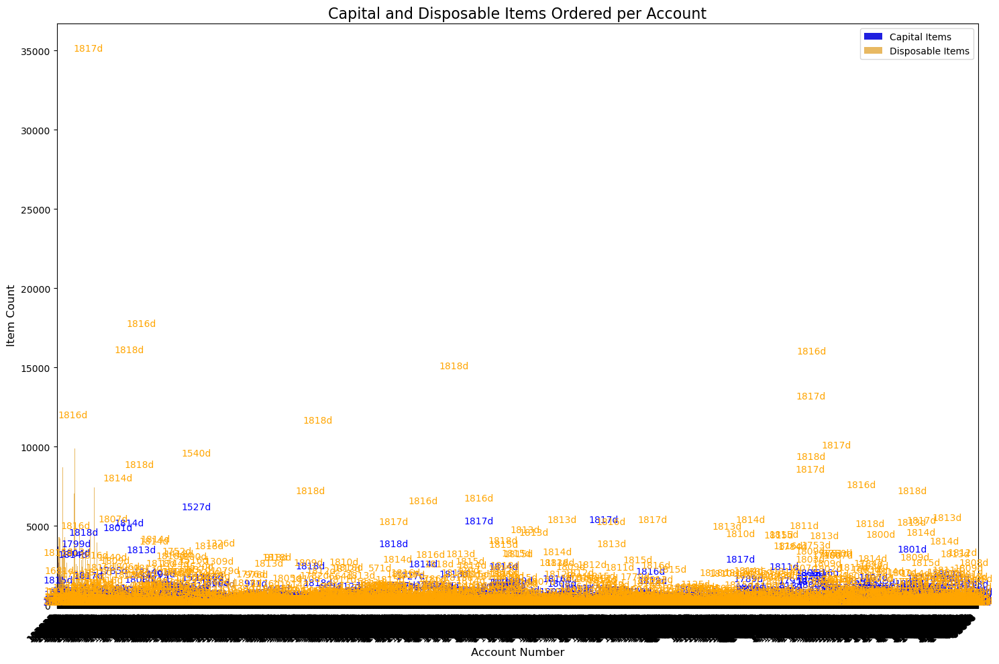

In [8]:
# Convert the filtered DataFrame to Pandas for visualization
pandas_df = filtered_df.toPandas()
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sort by the total count of capital and disposable items for better readability
pandas_df = pandas_df.sort_values(by=["Total_Capital_Items", "Total_Disposable_Items"], ascending=False)

# Plot a grouped bar chart
plt.figure(figsize=(15, 10))
x_labels = pandas_df["Account_Number"].astype(str)

# Plot Capital and Disposable counts
sns.barplot(x=x_labels, y=pandas_df["Total_Capital_Items"], color="blue", label="Capital Items")
sns.barplot(x=x_labels, y=pandas_df["Total_Disposable_Items"], color="orange", label="Disposable Items", alpha=0.7)

# Add annotations for time intervals
for i, row in pandas_df.iterrows():
    time_interval_capital = None if pd.isnull(row["First_Capital_Order_Date"]) or pd.isnull(row["Last_Capital_Order_Date"]) \
        else (pd.to_datetime(row["Last_Capital_Order_Date"]) - pd.to_datetime(row["First_Capital_Order_Date"])).days
    
    time_interval_disposable = None if pd.isnull(row["First_Disposable_Order_Date"]) or pd.isnull(row["Last_Disposable_Order_Date"]) \
        else (pd.to_datetime(row["Last_Disposable_Order_Date"]) - pd.to_datetime(row["First_Disposable_Order_Date"])).days
    
    if time_interval_capital:
        plt.text(i, row["Total_Capital_Items"] + 10, f"{time_interval_capital}d", color="blue", ha="center")
    if time_interval_disposable:
        plt.text(i, row["Total_Disposable_Items"] + 10, f"{time_interval_disposable}d", color="orange", ha="center")

# Customize the chart
plt.title("Capital and Disposable Items Ordered per Account", fontsize=16)
plt.xlabel("Account Number", fontsize=12)
plt.ylabel("Item Count", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.legend(loc="upper right")
plt.tight_layout()

# Show the plot
plt.show()


In [9]:
from pyspark.sql.functions import col, current_date, datediff, when

# Add a column for active/inactive status based on the time interval
# A user is considered active if the last order date is within the past 6 months (180 days)
filtered_df = filtered_df.withColumn(
    "User_Status",
    when(
        datediff(current_date(), col("Last_Capital_Order_Date")) <= 180,
        "Active"
    ).when(
        datediff(current_date(), col("Last_Disposable_Order_Date")) <= 180,
        "Active"
    ).otherwise("Inactive")
)

# Show the updated DataFrame
filtered_df.show(truncate=False)


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 11, Finished, Available, Finished)

+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+-----------+
|Account_Number|Total_Capital_Items|First_Capital_Order_Date|Last_Capital_Order_Date|Total_Disposable_Items|First_Disposable_Order_Date|Last_Disposable_Order_Date|User_Status|
+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+-----------+
|10001         |1                  |2020-11-13              |2020-11-13             |NULL                  |NULL                       |NULL                      |Inactive   |
|10002         |2                  |2020-01-07              |2020-07-02             |20                    |2020-03-09                 |2020-12-30                |Inactive   |
|10004         |3                  |2020-09-29              |2024-11-07             |1                     |2021-08-13  

StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 12, Finished, Available, Finished)

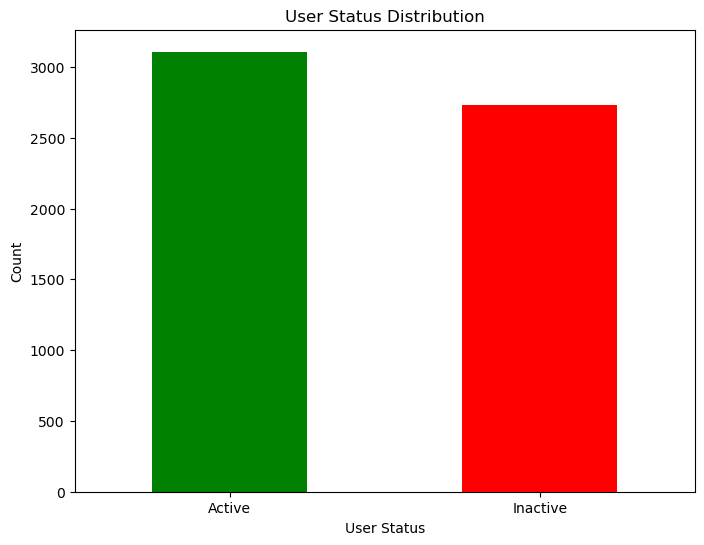

In [10]:
pandas_df = filtered_df.toPandas()

import matplotlib.pyplot as plt

# Count active/inactive users
user_status_counts = pandas_df["User_Status"].value_counts()

# Plot bar chart
plt.figure(figsize=(8, 6))
user_status_counts.plot(kind="bar", color=["green", "red"])
plt.title("User Status Distribution")
plt.xlabel("User Status")
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.show()


In [11]:
from pyspark.sql.functions import collect_list

# Join df and filtered_df on Account_Number
merged_df = df.join(filtered_df.select("Account_Number", "User_Status"), on="Account_Number", how="inner")

# Group by User_Status and aggregate DescriptionF
grouped_df = merged_df.groupBy("User_Status").agg(collect_list("DESCRIPTIONF").alias("Descriptions"))

# Show the grouped descriptions
grouped_df.show(truncate=False)

# For visualization, count occurrences of DescriptionF for each User_Status
description_counts = merged_df.groupBy("User_Status", "DESCRIPTIONF").count().orderBy("User_Status", "count", ascending=False)

# Show counts
description_counts.show(truncate=False)



StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 13, Finished, Cancelled, Cancelled)

KeyboardInterrupt while sending command.
Traceback (most recent call last):
  File "/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/py4j/java_gateway.py", line 1217, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
                          ^^^^^^^^^^^^^^^^^^^^^^
  File "/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/socket.py", line 706, in readinto
    return self._sock.recv_into(b)
           ^^^^^^^^^^^^^^^^^^^^^^^
KeyboardInterrupt


In [15]:
# Convert merged_df to Pandas DataFrame
pandas_df = merged_df.toPandas()

# Separate data by User_Status
active_descriptions = pandas_df[pandas_df["User_Status"] == "Active"]["DESCRIPTIONF"]
inactive_descriptions = pandas_df[pandas_df["User_Status"] == "Inactive"]["DESCRIPTIONF"]

# Count occurrences of DescriptionF for both user statuses
active_count = active_descriptions.value_counts()
inactive_count = inactive_descriptions.value_counts()

# Plot bar chart
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Active Users
plt.bar(active_count.index, active_count.values, color="green", alpha=0.7, label="Active Users")

# Inactive Users
plt.bar(inactive_count.index, inactive_count.values, color="red", alpha=0.5, label="Inactive Users")

plt.title("DescriptionF Distribution for Active and Inactive Users")
plt.xlabel("DESCRIPTIONF")
plt.ylabel("Count")
plt.legend()
plt.xticks(rotation=90)
plt.show()


StatementMeta(, cbf36ab2-7c1e-411e-9c0a-e39a86efcfb3, 17, Finished, Available, Finished)

In [13]:
from pyspark.sql.functions import col, sum

# Filter for active users in filtered_df
active_filtered_df = filtered_df.filter(col("User_Status") == "Active")

# Join with the original df to get the counts for Capital and Disposable items
active_counts_df = active_filtered_df.join(
    df, on="Account_Number", how="left"
).withColumn(
    "Capital_Count", when(col("Total_Capital_Items").isNotNull(), col("Total_Capital_Items")).otherwise(0)
).withColumn(
    "Disposable_Count", when(col("Total_Disposable_Items").isNotNull(), col("Total_Disposable_Items")).otherwise(0)
)

# Group by Account_Number and sum the counts of Capital and Disposable items
account_counts_df = active_counts_df.groupBy("Account_Number").agg(
    sum("Capital_Count").alias("Total_Capital_Items"),
    sum("Disposable_Count").alias("Total_Disposable_Items")
)

# Create a new column to sum both counts for ranking purposes
account_counts_df = account_counts_df.withColumn(
    "Total_Items_Count", col("Total_Capital_Items") + col("Total_Disposable_Items")
)

# Sort by the total items count and get the top 5 active Account Numbers
top_5_active_accounts = account_counts_df.orderBy("Total_Items_Count", ascending=False)

# Show the top 5 active Account Numbers
top_5_active_accounts.show(5, truncate=False)


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 15, Finished, Available, Finished)

+--------------+-------------------+----------------------+-----------------+
|Account_Number|Total_Capital_Items|Total_Disposable_Items|Total_Items_Count|
+--------------+-------------------+----------------------+-----------------+
|1046          |63722112           |1313291688            |1377013800       |
|10828         |117951344          |376904716             |494856060        |
|10891         |72127323           |383147829             |455275152        |
|13565         |31669185           |262933629             |294602814        |
|57246         |18633060           |268753890             |287386950        |
+--------------+-------------------+----------------------+-----------------+
only showing top 5 rows



In [14]:
from pyspark.sql.functions import col, sum, min, max, when

# Filter for active users in filtered_df
active_filtered_df = filtered_df.filter(col("User_Status") == "Active")

# Join with the original df to get the counts for Capital and Disposable items
active_counts_df = active_filtered_df.join(
    df, on="Account_Number", how="left"
).withColumn(
    "Capital_Count", when(col("Total_Capital_Items").isNotNull(), col("Total_Capital_Items")).otherwise(0)
).withColumn(
    "Disposable_Count", when(col("Total_Disposable_Items").isNotNull(), col("Total_Disposable_Items")).otherwise(0)
)

# Group by Account_Number and aggregate the counts of Capital and Disposable items
account_counts_df = active_counts_df.groupBy("Account_Number").agg(
    sum("Capital_Count").alias("Total_Capital_Items"),
    sum("Disposable_Count").alias("Total_Disposable_Items"),
    min("Invoiced_Date").alias("First_Invoice_Date"),
    max("Invoiced_Date").alias("Last_Invoice_Date")
)

# Create a new column to sum both counts for ranking purposes
account_counts_df = account_counts_df.withColumn(
    "Total_Items_Count", col("Total_Capital_Items") + col("Total_Disposable_Items")
)

# Sort by the total items count and get the top 5 active Account Numbers
top_5_active_accounts = account_counts_df.orderBy("Total_Items_Count", ascending=False)

# Show the top 5 active Account Numbers with their first and last invoice dates
top_5_active_accounts.show(5, truncate=False)


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 16, Finished, Available, Finished)

+--------------+-------------------+----------------------+------------------+-----------------+-----------------+
|Account_Number|Total_Capital_Items|Total_Disposable_Items|First_Invoice_Date|Last_Invoice_Date|Total_Items_Count|
+--------------+-------------------+----------------------+------------------+-----------------+-----------------+
|1046          |63722112           |1313291688            |2020-01-02        |2024-12-23       |1377013800       |
|10828         |117951344          |376904716             |2020-01-01        |2024-12-23       |494856060        |
|10891         |72127323           |383147829             |2020-01-01        |2024-12-23       |455275152        |
|13565         |31669185           |262933629             |2020-01-01        |2024-12-23       |294602814        |
|57246         |18633060           |268753890             |2020-01-03        |2024-12-23       |287386950        |
+--------------+-------------------+----------------------+------------------+--

In [16]:
from pyspark.sql.functions import col, sum, min, max, collect_list

# Filter for active users in filtered_df
active_filtered_df = filtered_df.filter(col("User_Status") == "Active")

# Check if there are active users
active_count = active_filtered_df.count()
print(f"Active user count: {active_count}")

# Join with the original df to get the counts for Capital and Disposable items
joined_df = active_filtered_df.join(
    df, on="Account_Number", how="left"
)

# Check if join is successful
joined_df.show(5, truncate=False)

# Aggregate Capital and Disposable counts, and collect DESCRIPTIONF
account_counts_df = joined_df.groupBy("Account_Number").agg(
    sum("Total_Capital_Items").alias("Total_Capital_Items"),
    sum("Total_Disposable_Items").alias("Total_Disposable_Items"),
    min("Invoiced_Date").alias("First_Invoice_Date"),
    max("Invoiced_Date").alias("Last_Invoice_Date"),
    collect_list("DESCRIPTIONF").alias("Descriptions")
)

# Check intermediate output
account_counts_df.show(5, truncate=False)

# Create a new column to sum both counts for ranking purposes
account_counts_df = account_counts_df.withColumn(
    "Total_Items_Count", col("Total_Capital_Items") + col("Total_Disposable_Items")
)

# Sort by the total items count and get the top 5 active Account Numbers
top_5_active_accounts = account_counts_df.orderBy("Total_Items_Count", ascending=False)

# Show the top 5 active Account Numbers with their first and last invoice dates, and DESCRIPTIONF
top_5_active_accounts.show(5, truncate=False)


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 18, Finished, Available, Finished)

Active user count: 3108
+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+-----------+---------------------------+------------------------------+-------------+--------------------------------------+------------------------------+---------------------+
|Account_Number|Total_Capital_Items|First_Capital_Order_Date|Last_Capital_Order_Date|Total_Disposable_Items|First_Disposable_Order_Date|Last_Disposable_Order_Date|User_Status|Order_Line_ID              |DESCRIPTIONF                  |Invoiced_Date|Product_Segment_Current_Extnl_Cap_Disp|Product_Segment_Extnl_Cap_Disp|Capital_Disp_Inv_Item|
+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+-----------+---------------------------+------------------------------+-------------+--------------------------------------+-------

In [19]:
from pyspark.sql.functions import col, sum, min, max, first

# Filter for active users in filtered_df
active_filtered_df = filtered_df.filter(col("User_Status") == "Active")

# Check if there are active users
active_count = active_filtered_df.count()
print(f"Active user count: {active_count}")

# Join with the original df to get the counts for Capital and Disposable items
joined_df = active_filtered_df.join(df, on="Account_Number", how="left")

# Check if join is successful
joined_df.show(5, truncate=False)

# Aggregate Capital and Disposable counts, and get the first DESCRIPTIONF for each Account_Number
account_counts_df = joined_df.groupBy("Account_Number").agg(
    sum("Total_Capital_Items").alias("Total_Capital_Items"),
    sum("Total_Disposable_Items").alias("Total_Disposable_Items"),
    min("Invoiced_Date").alias("First_Invoice_Date"),
    max("Invoiced_Date").alias("Last_Invoice_Date"),
    first("DESCRIPTIONF").alias("Description")  # Take the first DESCRIPTIONF
)

# Check intermediate output
account_counts_df.show(5, truncate=False)

# Create a new column to sum both counts for ranking purposes
account_counts_df = account_counts_df.withColumn(
    "Total_Items_Count", col("Total_Capital_Items") + col("Total_Disposable_Items")
)

# Sort by the total items count and get the top 5 active Account Numbers
top_5_active_accounts = account_counts_df.orderBy("Total_Items_Count", ascending=False).limit(5)

# Show the top 5 active Account Numbers with their first and last invoice dates, and DESCRIPTIONF
top_5_active_accounts.show(5, truncate=False)


StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 21, Finished, Available, Finished)

Active user count: 3108
+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+-----------+---------------------------+------------------------------+-------------+--------------------------------------+------------------------------+---------------------+
|Account_Number|Total_Capital_Items|First_Capital_Order_Date|Last_Capital_Order_Date|Total_Disposable_Items|First_Disposable_Order_Date|Last_Disposable_Order_Date|User_Status|Order_Line_ID              |DESCRIPTIONF                  |Invoiced_Date|Product_Segment_Current_Extnl_Cap_Disp|Product_Segment_Extnl_Cap_Disp|Capital_Disp_Inv_Item|
+--------------+-------------------+------------------------+-----------------------+----------------------+---------------------------+--------------------------+-----------+---------------------------+------------------------------+-------------+--------------------------------------+-------

In [20]:

df_new = spark.sql(""" select *
from KPMG_Bronze.dbo.EDW_Conmed_Sales_Data_Mart""")

StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 22, Finished, Available, Finished)

In [21]:
df_new.show()

StatementMeta(, b273f4c7-beed-4e3e-af23-65e6c10c0d02, 23, Finished, Available, Finished)

+--------------+--------------+--------------------+--------------------+------------------+-----------------+--------------+--------------+----------+-----------+---------+-------------+-----------------+-------------------+--------------------+-----------------+--------------+--------------------+-----------------+-------------+----------+-------------+------------+--------------+----------------+------------+---------------+---------------+----------------+----------------+-----------+--------------+-----------------+---------------+-----------------+------------------+--------------------+--------------------+---------------+------------------+---------------------------+-------------------------------+------------------------+---------------------------+------------------------------+-----------------------+--------------------------+-----------------------------------+---------------------------------------+--------------------------------+-----------------------------------+----